<a href="https://colab.research.google.com/github/AytanAb/AytanAb/blob/main/TheLASTNEWVERSION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 13.6 gigabytes of available RAM

Not using a high-RAM runtime


In [ ]:
!pip install -q segmentation-models-pytorch
!pip install -q albumentations
!pip install -q torchinfo

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 58.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# warnings
import warnings
warnings.filterwarnings("ignore")
# Data handling
import pandas as pd
import numpy as np
# Data visualization
import matplotlib.pyplot as plt
import cv2
from PIL import Image
# train test split
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
# Torch
import torch
from torch.utils.data import Dataset, DataLoader
from torch import nn, optim
from torchinfo import summary
import segmentation_models_pytorch as smp
from torchvision import transforms
import albumentations as A
import random
#tenserflow
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# os
import os
import shutil
# Path
from pathlib import Path
# tqdm
from tqdm.auto import tqdm
import tarfile


In [ ]:
# Step 1: Unmount and Remount Drive
from google.colab import drive
drive.flush_and_unmount()  # Clean unmount
print(" Drive unmounted. Now remounting...")
# Run this in a new cell after remount prompt
drive.mount('/content/drive')

Drive not mounted, so nothing to flush and unmount.
 Drive unmounted. Now remounting...
Mounted at /content/drive


In [ ]:
# Step 2: Setup paths
TAR_PATH = "/content/drive/MyDrive/Dataset_filtered.tar"
NEW_FOLDER_NAME = "CleanExtractedDataset"
EXTRACT_PATH = f"/content/drive/MyDrive/{NEW_FOLDER_NAME}"

# Step 3: Force delete the folder if it exists
if os.path.exists(EXTRACT_PATH):
    print(" Old folder exists. Deleting it...")
    shutil.rmtree(EXTRACT_PATH)
    print(" Old folder deleted.")

# Step 4: Create new folder and extract
os.makedirs(EXTRACT_PATH, exist_ok=True)

with tarfile.open(TAR_PATH, "r") as tar:
    tar.extractall(path=EXTRACT_PATH)
    print(f"\n Extracted tar into: {EXTRACT_PATH}")

# Step 5: Print structure to confirm
print("\nFolder structure:")
for root, dirs, files in os.walk(EXTRACT_PATH):
    print(f"{root}")
    for d in dirs:
        print(f"   {d}")
    for f in files[:5]:
        print(f"   {f}")



 Extracted tar into: /content/drive/MyDrive/CleanExtractedDataset

Folder structure:
/content/drive/MyDrive/CleanExtractedDataset
   Dataset_filtered
/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered
   Test
   TrainVal
   ReadME.md
/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Test
   color
   label
/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Test/color
   english_cocker_spaniel_23.jpg
   scottish_terrier_199.jpg
   Birman_5.jpg
   staffordshire_bull_terrier_75.jpg
   pomeranian_72.jpg
/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Test/label
   american_pit_bull_terrier_63.png
   samoyed_58.png
   British_Shorthair_87.png
   japanese_chin_19.png
   Abyssinian_82.png
/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/TrainVal
   color
   label
/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/TrainVal/color
   newfoundland_160.jpg
   Siamese_119.jpg
   saint_bernard_142.jpg
   japanese_chin_185.jpg
  

In [ ]:
EXTRACT_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered"

# Corrected paths (TrainVal, not Train)
TRAINVAL_IMAGES_PATH = os.path.join(EXTRACT_PATH, "TrainVal/color")
TRAINVAL_MASKS_PATH = os.path.join(EXTRACT_PATH, "TrainVal/label")

trainval_images_filenames = sorted(os.listdir(TRAINVAL_IMAGES_PATH))
trainval_masks_filenames = sorted(os.listdir(TRAINVAL_MASKS_PATH))

image_mask_pairs = [
    (img, img.replace(".jpg", ".png"))
    for img in trainval_images_filenames
    if img.replace(".jpg", ".png") in trainval_masks_filenames
]

In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Step 1: Define paths
EXTRACT_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered"

TRAINVAL_IMAGES_PATH = os.path.join(EXTRACT_PATH, "TrainVal/color")
TRAINVAL_MASKS_PATH = os.path.join(EXTRACT_PATH, "TrainVal/label")

TRAIN_IMAGES_PATH = os.path.join(EXTRACT_PATH, "Train/color")
TRAIN_MASKS_PATH = os.path.join(EXTRACT_PATH, "Train/label")
VAL_IMAGES_PATH = os.path.join(EXTRACT_PATH, "Validation/color")
VAL_MASKS_PATH = os.path.join(EXTRACT_PATH, "Validation/label")


# Step 2: Create destination folders
os.makedirs(TRAIN_IMAGES_PATH, exist_ok=True)
os.makedirs(TRAIN_MASKS_PATH, exist_ok=True)
os.makedirs(VAL_IMAGES_PATH, exist_ok=True)
os.makedirs(VAL_MASKS_PATH, exist_ok=True)

# Step 3: Match images and masks
trainval_images_filenames = sorted(os.listdir(TRAINVAL_IMAGES_PATH))
trainval_masks_filenames = sorted(os.listdir(TRAINVAL_MASKS_PATH))

image_mask_pairs = [
    (img, img.replace(".jpg", ".png"))
    for img in trainval_images_filenames
    if img.replace(".jpg", ".png") in trainval_masks_filenames
]

# Step 4: Split
train_pairs, val_pairs = train_test_split(image_mask_pairs, test_size=0.2, random_state=42)

# Step 5: Move function
def move_files(pairs, src_img_path, src_mask_path, dst_img_path, dst_mask_path):
    for img_name, mask_name in pairs:
        shutil.move(os.path.join(src_img_path, img_name), os.path.join(dst_img_path, img_name))
        shutil.move(os.path.join(src_mask_path, mask_name), os.path.join(dst_mask_path, mask_name))

# Step 6: Move files
move_files(train_pairs, TRAINVAL_IMAGES_PATH, TRAINVAL_MASKS_PATH, TRAIN_IMAGES_PATH, TRAIN_MASKS_PATH)
move_files(val_pairs, TRAINVAL_IMAGES_PATH, TRAINVAL_MASKS_PATH, VAL_IMAGES_PATH, VAL_MASKS_PATH)

print("Dataset split complete!")
print(f"Training images: {len(train_pairs)}")
print(f"Validation images: {len(val_pairs)}")


Dataset split complete!
Training images: 2938
Validation images: 735


In [ ]:
TEST_IMAGES_PATH = os.path.join(EXTRACT_PATH, "Test/color")
TEST_MASKS_PATH = os.path.join(EXTRACT_PATH, "Test/label")

In [ ]:
print("Train Images:", len(os.listdir(TRAIN_IMAGES_PATH)))
print("Train Masks:", len(os.listdir(TRAIN_MASKS_PATH)))
print("Validation Images:", len(os.listdir(VAL_IMAGES_PATH)))
print("Validation Masks:", len(os.listdir(VAL_MASKS_PATH)))
print("Test Images:", len(os.listdir(TEST_IMAGES_PATH)))
print("Test Masks:", len(os.listdir(TEST_MASKS_PATH)))

Train Images: 2938
Train Masks: 2938
Validation Images: 735
Validation Masks: 735
Test Images: 3694
Test Masks: 3694


In [ ]:
# Function to load an image
def load_image(image_path):
    image = cv2.imread(image_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB) if image is not None else None

# Function to load a mask
def load_mask(mask_path):
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    return mask if mask is not None else None

# Function to show image and its corresponding mask
def show_image_mask(image_path, mask_path):
    image = load_image(image_path)
    mask = load_mask(mask_path)

    if image is None or mask is None:
        print(f"Skipping: {image_path} or {mask_path} not found")
        return

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.axis('off')
    plt.title("Image")

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.title("Mask")

    plt.show()


🔹 Training Samples


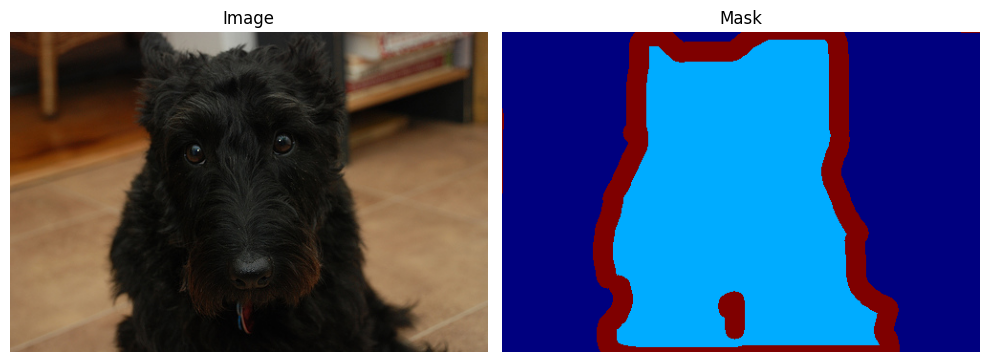

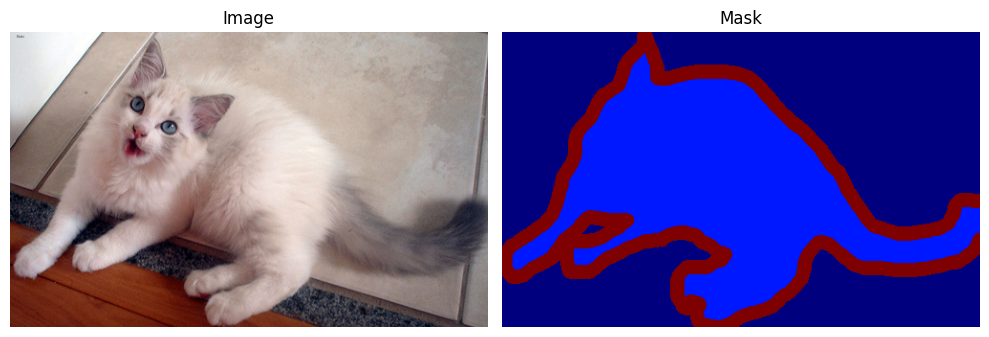

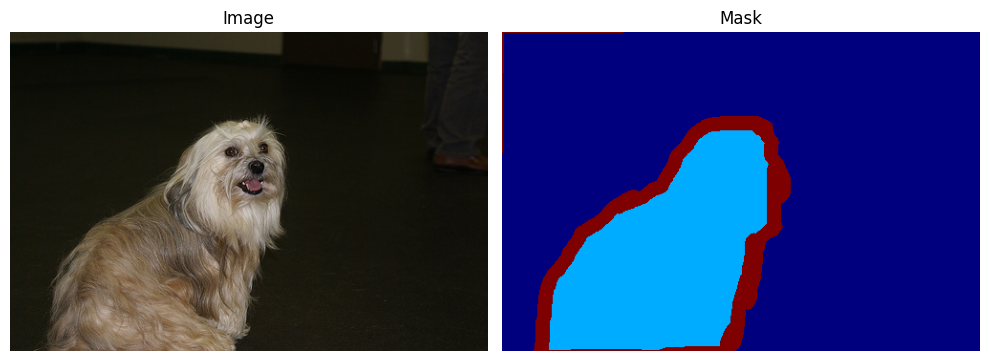

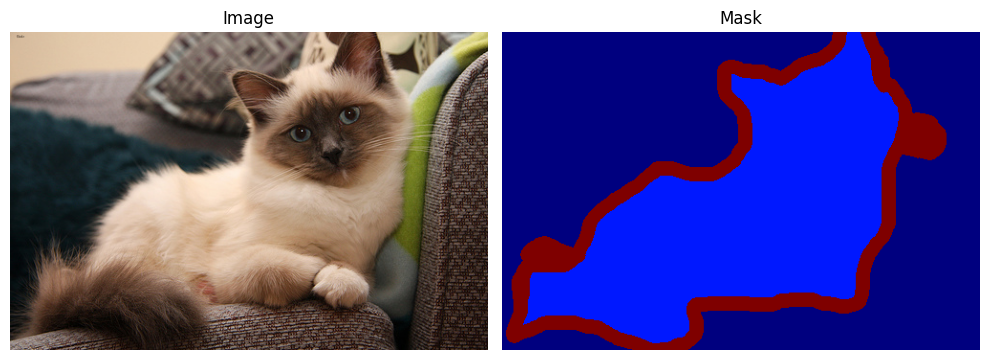

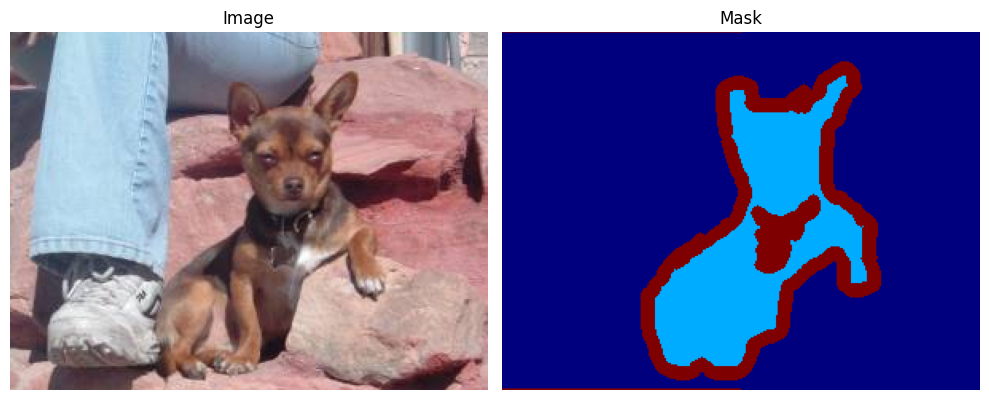


🔹 Validation Samples


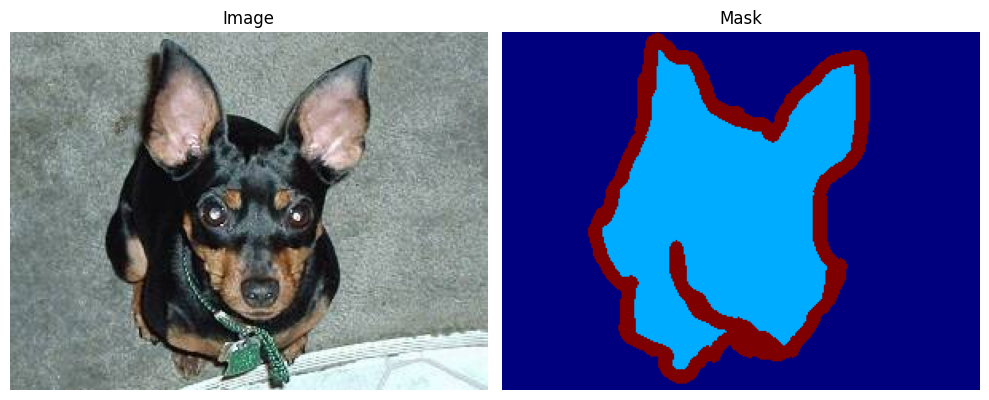

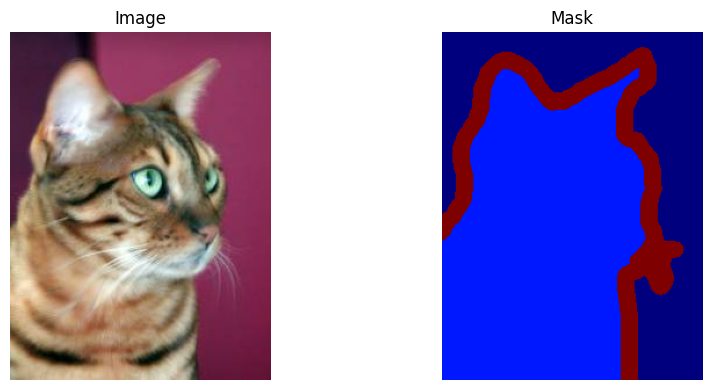

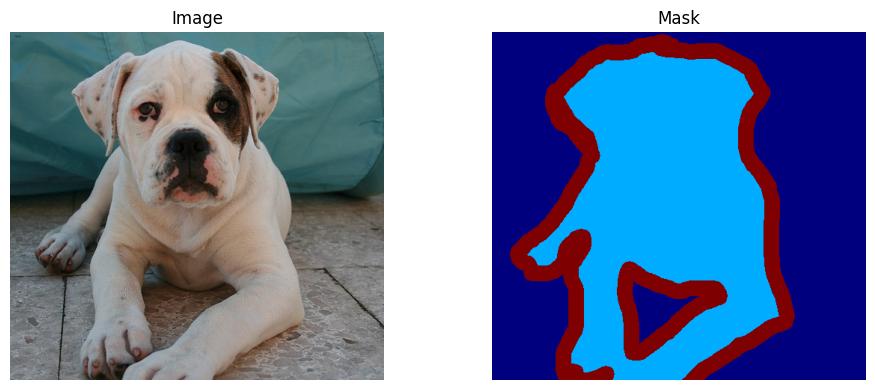

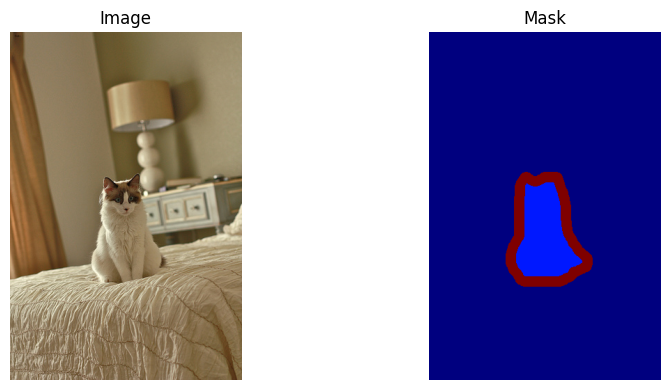

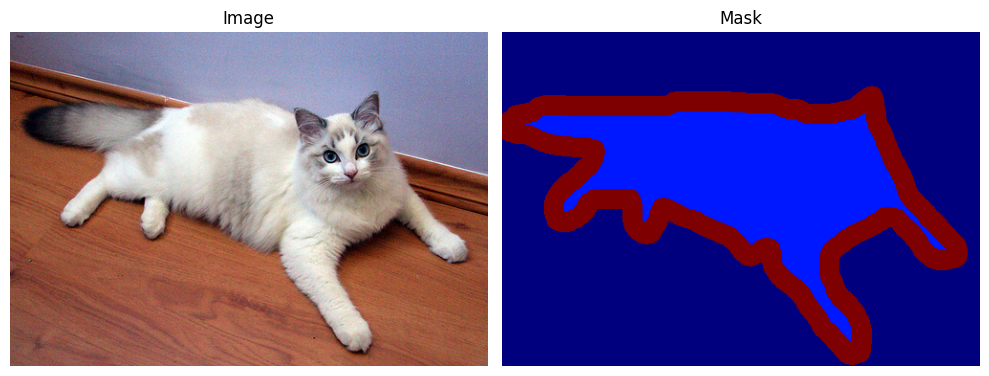

In [ ]:
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os

def show_image_mask(img_path, mask_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(mask, cmap='jet')
    plt.title("Mask")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

#  Correct pairing by sorted filenames
train_pairs = list(zip(
    sorted(os.listdir(TRAIN_IMAGES_PATH)),
    sorted(os.listdir(TRAIN_MASKS_PATH))
))
train_pairs = shuffle(train_pairs, random_state=42)

val_pairs = list(zip(
    sorted(os.listdir(VAL_IMAGES_PATH)),
    sorted(os.listdir(VAL_MASKS_PATH))
))
val_pairs = shuffle(val_pairs, random_state=42)

# Show matching pairs
print("\n🔹 Training Samples")
for i in range(5):
    show_image_mask(
        os.path.join(TRAIN_IMAGES_PATH, train_pairs[i][0]),
        os.path.join(TRAIN_MASKS_PATH, train_pairs[i][1])
    )

print("\n🔹 Validation Samples")
for i in range(5):
    show_image_mask(
        os.path.join(VAL_IMAGES_PATH, val_pairs[i][0]),
        os.path.join(VAL_MASKS_PATH, val_pairs[i][1])
    )


In [ ]:
# Function to get image sizes
def get_image_sizes(image_dir):
    sizes = []
    for image_file in os.listdir(image_dir):
        image_path = os.path.join(image_dir, image_file)
        image = cv2.imread(image_path)
        if image is not None:
            sizes.append(image.shape[:2])  # Get height and width
    return sizes

# Function to print top 10 unique image sizes and their counts
def print_top_image_sizes(image_sizes):
    unique_sizes, counts = np.unique(image_sizes, axis=0, return_counts=True)
    sorted_indices = np.argsort(-counts)  # Sort by frequency in descending order
    print("\nTop 10 Image Sizes:")
    for i in sorted_indices[:10]:  # Show only top 10
        print(f"Size: {unique_sizes[i]}, Count: {counts[i]}")

# Get and print top 10 image size statistics
train_image_sizes = get_image_sizes(TRAIN_IMAGES_PATH)
val_image_sizes = get_image_sizes(VAL_IMAGES_PATH)

print("\nTraining Set Image Sizes:")
print_top_image_sizes(train_image_sizes)
print("\nValidation Set Image Sizes:")
print_top_image_sizes(val_image_sizes)


Training Set Image Sizes:

Top 10 Image Sizes:
Size: [375 500], Count: 626
Size: [333 500], Count: 392
Size: [500 375], Count: 201
Size: [500 333], Count: 167
Size: [225 300], Count: 159
Size: [334 500], Count: 96
Size: [332 500], Count: 64
Size: [500 334], Count: 54
Size: [335 500], Count: 36
Size: [500 332], Count: 29

Validation Set Image Sizes:

Top 10 Image Sizes:
Size: [375 500], Count: 143
Size: [333 500], Count: 95
Size: [500 333], Count: 54
Size: [500 375], Count: 48
Size: [225 300], Count: 42
Size: [334 500], Count: 27
Size: [500 334], Count: 12
Size: [332 500], Count: 10
Size: [500 332], Count: 10
Size: [300 225], Count: 10


In [ ]:
# Define target resize dimensions
TARGET_WIDTH = 256
TARGET_HEIGHT = 256

# Function to resize images while preserving aspect ratio
def resize_image(image, target_width, target_height):
    return cv2.resize(image, (target_width, target_height), interpolation=cv2.INTER_AREA)

# Function to resize and save images in a directory
def resize_and_save_images(input_dir, output_dir, target_width, target_height):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir, exist_ok=True)

    for filename in os.listdir(input_dir):
        image_path = os.path.join(input_dir, filename)
        image = cv2.imread(image_path)

        if image is not None:
            resized_image = resize_image(image, target_width, target_height)
            output_path = os.path.join(output_dir, filename)
            cv2.imwrite(output_path, resized_image)
        else:
            print(f"Skipping {filename}, could not read image.")

# Define output directories for resized images
RESIZED_TRAIN_IMAGES_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Resized_Train/color"
RESIZED_TRAIN_MASKS_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Resized_Train/label"

RESIZED_VAL_IMAGES_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Resized_Validation/color"
RESIZED_VAL_MASKS_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Resized_Validation/label"

RESIZED_TEST_IMAGES_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Resized_Test/color"
RESIZED_TEST_MASKS_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Resized_Test/label"


# Resize training, validation, and test images
resize_and_save_images(TRAIN_IMAGES_PATH, RESIZED_TRAIN_IMAGES_PATH, TARGET_WIDTH, TARGET_HEIGHT)
resize_and_save_images(TRAIN_MASKS_PATH, RESIZED_TRAIN_MASKS_PATH, TARGET_WIDTH, TARGET_HEIGHT)
resize_and_save_images(VAL_IMAGES_PATH, RESIZED_VAL_IMAGES_PATH, TARGET_WIDTH, TARGET_HEIGHT)
resize_and_save_images(VAL_MASKS_PATH, RESIZED_VAL_MASKS_PATH, TARGET_WIDTH, TARGET_HEIGHT)
resize_and_save_images(TEST_IMAGES_PATH, RESIZED_TEST_IMAGES_PATH, TARGET_WIDTH, TARGET_HEIGHT)
resize_and_save_images(TEST_MASKS_PATH, RESIZED_TEST_MASKS_PATH, TARGET_WIDTH, TARGET_HEIGHT)

print("\nResizing complete! Images saved in Resized_Train, Resized_Validation, and Resized_Test folders.")

print("\nResizing complete! Images saved in Resized_Train and Resized_Validation folders.")


Resizing complete! Images saved in Resized_Train, Resized_Validation, and Resized_Test folders.

Resizing complete! Images saved in Resized_Train and Resized_Validation folders.


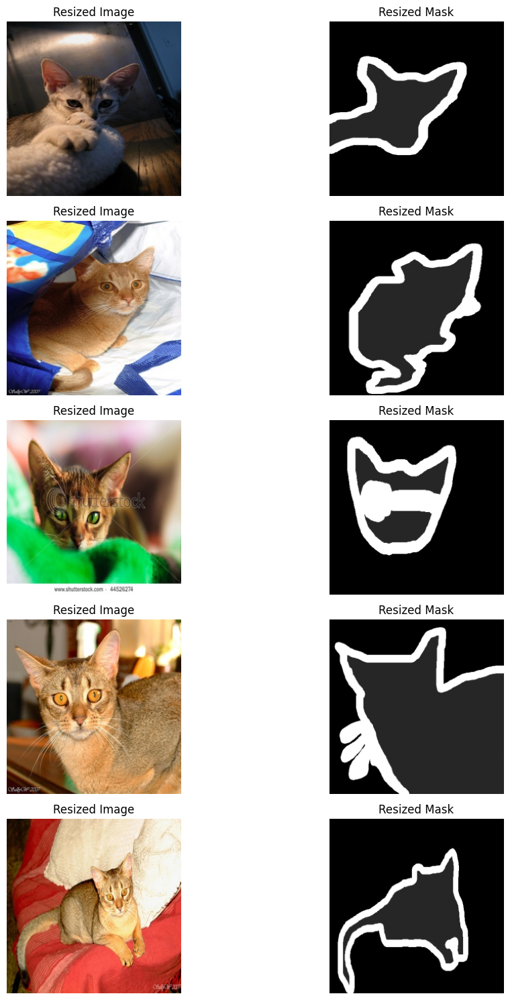

In [ ]:
# Function to display a few resized images and masks
def show_sample_resized_images(image_dir, mask_dir, num_samples=5):
    image_filenames = sorted(os.listdir(image_dir))
    mask_filenames = sorted(os.listdir(mask_dir))

    if len(image_filenames) == 0 or len(mask_filenames) == 0:
        print("No resized images found.")
        return

    plt.figure(figsize=(12, num_samples * 3))
    for i in range(min(num_samples, len(image_filenames))):
        image_path = os.path.join(image_dir, image_filenames[i])
        mask_path = os.path.join(mask_dir, mask_filenames[i])

        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        plt.subplot(num_samples, 2, 2 * i + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title("Resized Image")

        plt.subplot(num_samples, 2, 2 * i + 2)
        plt.imshow(mask, cmap='gray')
        plt.axis('off')
        plt.title("Resized Mask")

    plt.tight_layout()
    plt.show()

# Display sample resized images and masks
show_sample_resized_images(RESIZED_TRAIN_IMAGES_PATH, RESIZED_TRAIN_MASKS_PATH)

In [ ]:
#  Define strong augmentation pipeline with resizing
augmentation = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.05, rotate_limit=15, p=0.5),
    A.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=0.3),
    A.GridDistortion(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.CLAHE(p=0.3),
    A.RandomGamma(p=0.2),
    A.GaussianBlur(blur_limit=(3, 7), p=0.2),
    A.Resize(256, 256)
])

In [ ]:
import os
import cv2
import albumentations as A

#  Create output directories before augmentation
AUG_BASE_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered/Augmented_Train"
AUG_TRAIN_IMAGES_PATH = os.path.join(AUG_BASE_PATH, "color")
AUG_TRAIN_MASKS_PATH = os.path.join(AUG_BASE_PATH, "label")

os.makedirs(AUG_TRAIN_IMAGES_PATH, exist_ok=True)
os.makedirs(AUG_TRAIN_MASKS_PATH, exist_ok=True)

#  Augmentation function
def augment_and_save_images(input_dir, mask_dir, output_dir, output_mask_dir, num_augments=3):
    image_filenames = sorted(os.listdir(input_dir))
    mask_filenames = sorted(os.listdir(mask_dir))

    for image_filename, mask_filename in zip(image_filenames, mask_filenames):
        image_path = os.path.join(input_dir, image_filename)
        mask_path = os.path.join(mask_dir, mask_filename)

        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        if image is not None and mask is not None:
            for i in range(num_augments):
                augmented = augmentation(image=image, mask=mask)
                aug_image = augmented['image']
                aug_mask = augmented['mask']

                aug_image_filename = f"aug_{i}_{image_filename}"
                aug_mask_filename = f"aug_{i}_{mask_filename}"

                cv2.imwrite(os.path.join(output_dir, aug_image_filename), aug_image)
                cv2.imwrite(os.path.join(output_mask_dir, aug_mask_filename), aug_mask)
        else:
            print(f" Skipping {image_filename} or {mask_filename}, could not read.")

#  Apply augmentation using resized training images/masks
augment_and_save_images(
    RESIZED_TRAIN_IMAGES_PATH,
    RESIZED_TRAIN_MASKS_PATH,
    AUG_TRAIN_IMAGES_PATH,
    AUG_TRAIN_MASKS_PATH
)

print("\nData augmentation complete! Augmented images saved in Augmented_Train folder.")



Data augmentation complete! Augmented images saved in Augmented_Train folder.


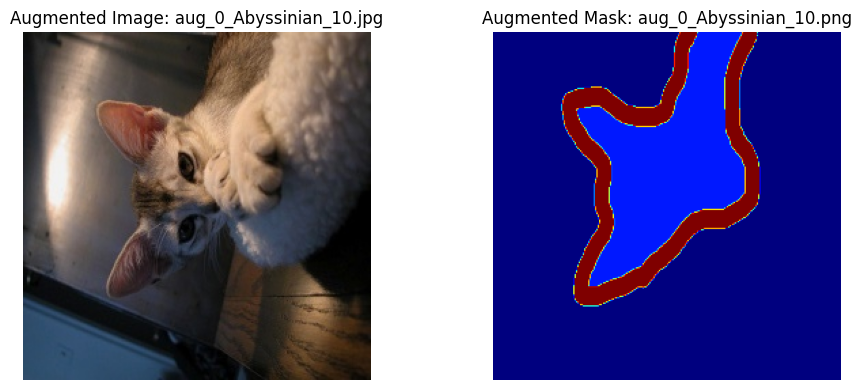

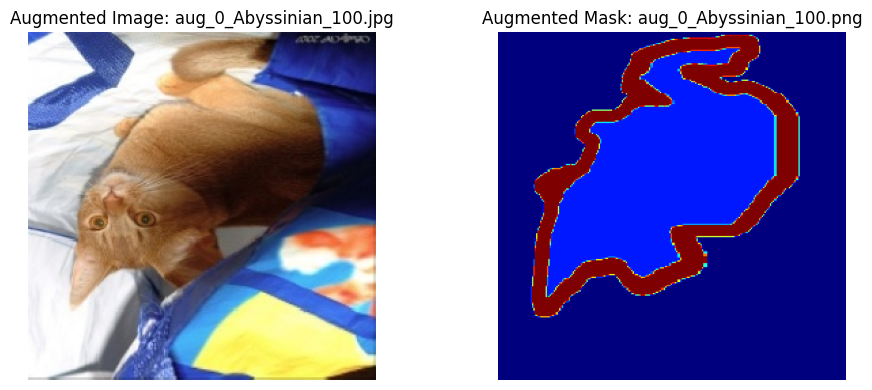

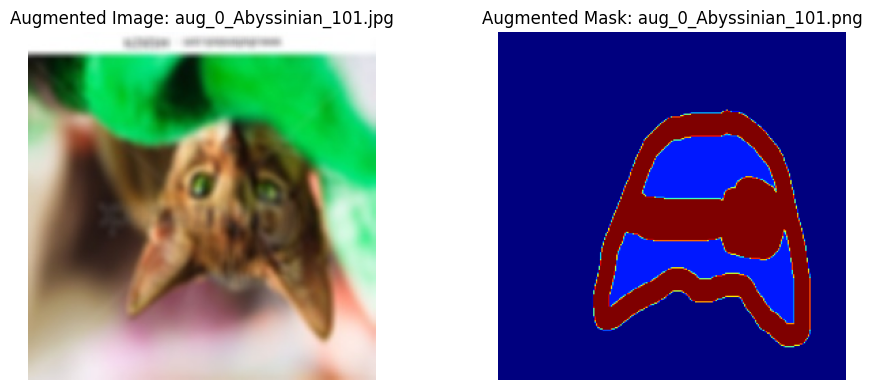

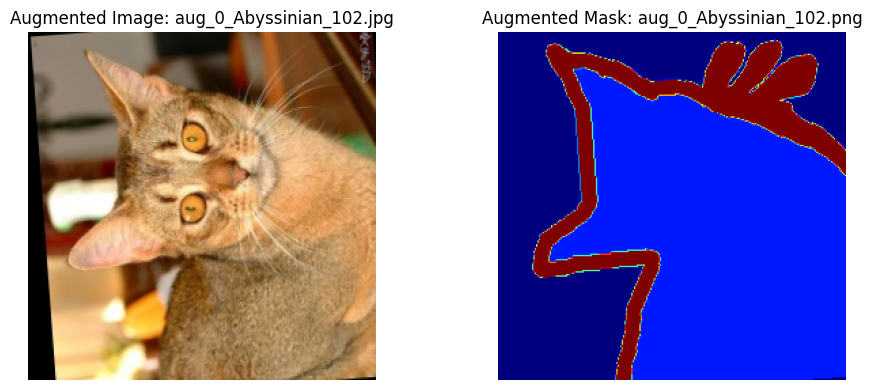

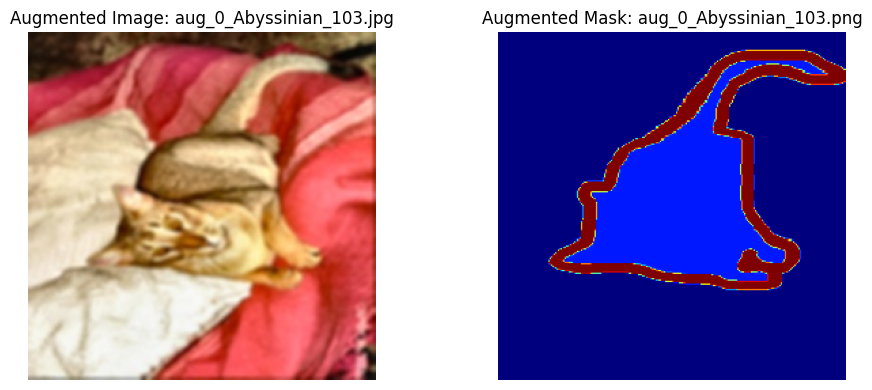

In [ ]:
import matplotlib.pyplot as plt

def show_augmented_samples(image_dir, mask_dir, num_samples=5):
    image_filenames = sorted(os.listdir(image_dir))[:num_samples]
    mask_filenames = sorted(os.listdir(mask_dir))[:num_samples]

    for img_file, mask_file in zip(image_filenames, mask_filenames):
        img_path = os.path.join(image_dir, img_file)
        mask_path = os.path.join(mask_dir, mask_file)

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        plt.figure(figsize=(10, 4))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title(f"Augmented Image: {img_file}")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(mask, cmap='jet')
        plt.title(f"Augmented Mask: {mask_file}")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

# Show samples from the augmented folder
show_augmented_samples(AUG_TRAIN_IMAGES_PATH, AUG_TRAIN_MASKS_PATH, num_samples=5)


Using device: cuda


100%|██████████| 1469/1469 [06:53<00:00,  3.55it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.7712, Dice=0.8685, Acc=0.8154
Class 75: IoU=0.3750, Dice=0.4687, Acc=0.8638
Class 255: IoU=0.3713, Dice=0.5382, Acc=0.9084
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.7670, Dice=0.8672, Acc=0.8142
Class 75: IoU=0.4698, Dice=0.6312, Acc=0.8589
Class 255: IoU=0.3423, Dice=0.5084, Acc=0.9055
Epoch 1, Loss: 1.0856
Train IoU: 0.5264, Dice: 0.6690, Acc: 0.8595
 Val IoU: 0.5058, Dice: 0.6251, Acc: 0.8625


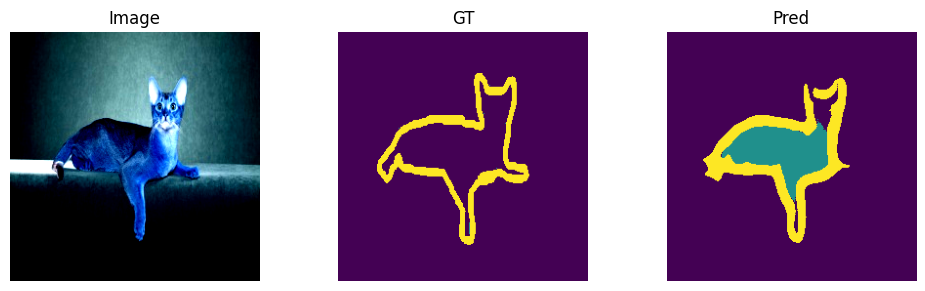

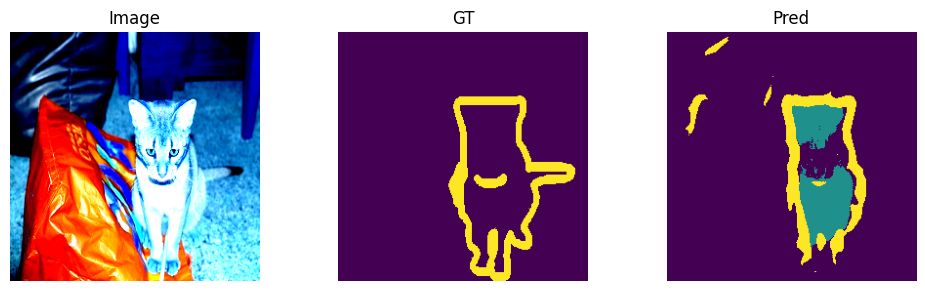

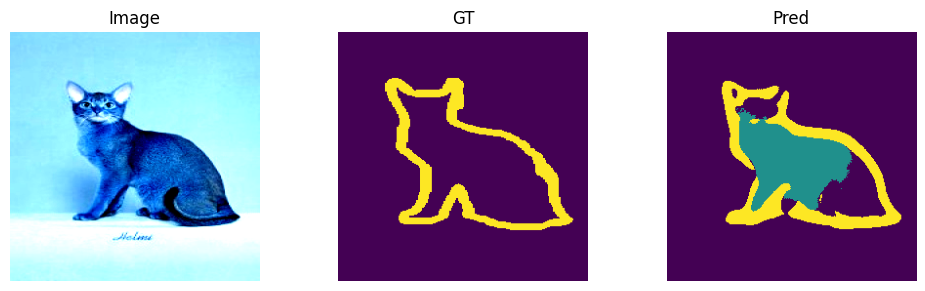

100%|██████████| 1469/1469 [05:31<00:00,  4.43it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.7778, Dice=0.8724, Acc=0.8175
Class 75: IoU=0.3050, Dice=0.4041, Acc=0.8700
Class 255: IoU=0.3898, Dice=0.5562, Acc=0.9130
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.7790, Dice=0.8749, Acc=0.8153
Class 75: IoU=0.4071, Dice=0.5698, Acc=0.8688
Class 255: IoU=0.3650, Dice=0.5332, Acc=0.9112
Epoch 2, Loss: 0.9068
Train IoU: 0.5170, Dice: 0.6593, Acc: 0.8651
 Val IoU: 0.4909, Dice: 0.6109, Acc: 0.8668


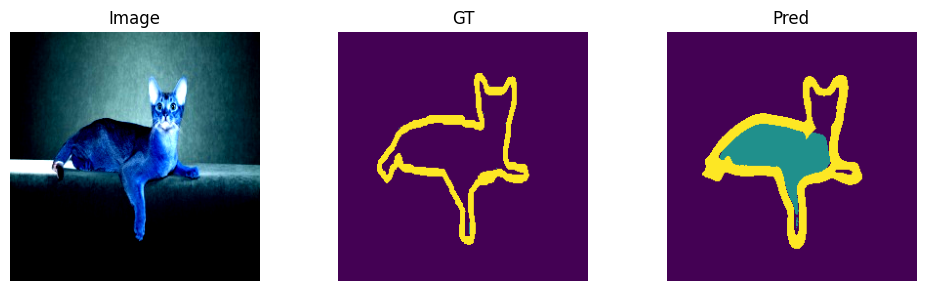

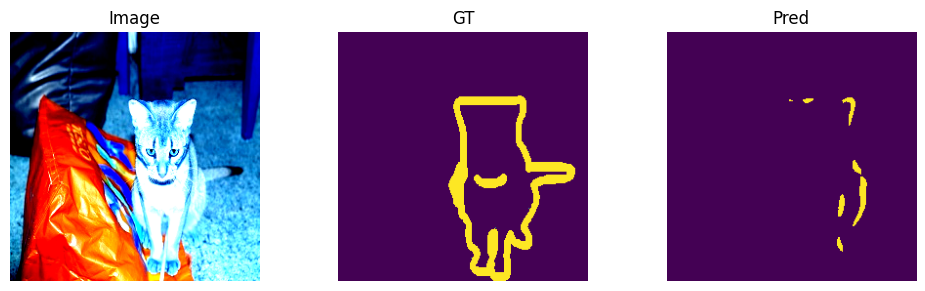

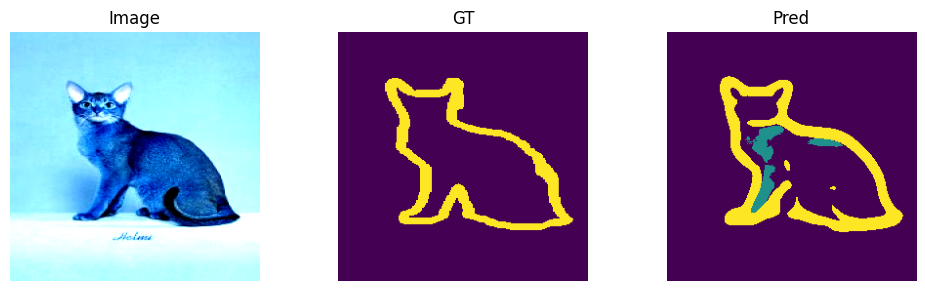

100%|██████████| 1469/1469 [05:33<00:00,  4.41it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8313, Dice=0.9065, Acc=0.8694
Class 75: IoU=0.4598, Dice=0.5332, Acc=0.9074
Class 255: IoU=0.4434, Dice=0.6112, Acc=0.9261
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8324, Dice=0.9080, Acc=0.8705
Class 75: IoU=0.6125, Dice=0.7538, Acc=0.9081
Class 255: IoU=0.4157, Dice=0.5858, Acc=0.9239
Epoch 3, Loss: 0.8301
Train IoU: 0.6202, Dice: 0.7492, Acc: 0.9008
 Val IoU: 0.5782, Dice: 0.6836, Acc: 0.9009


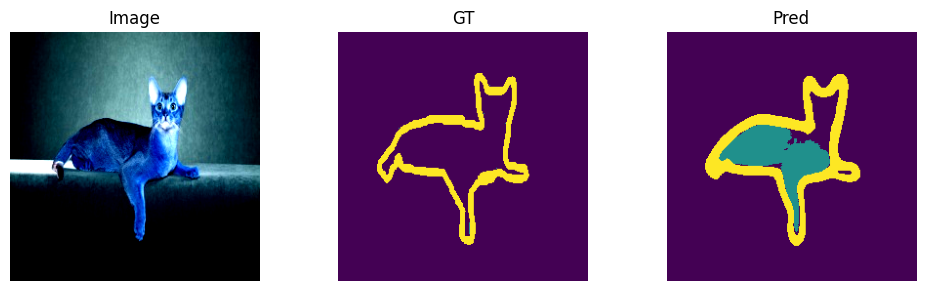

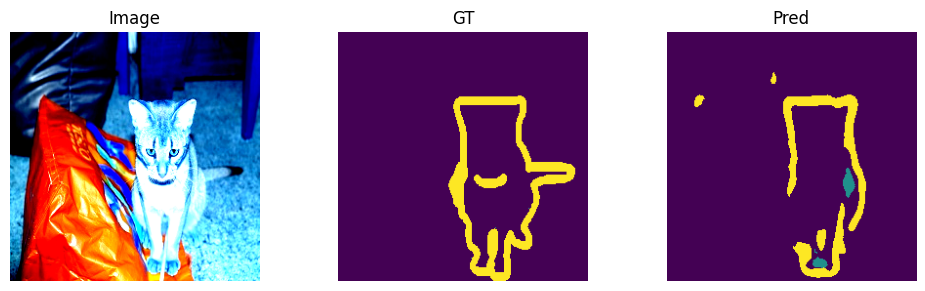

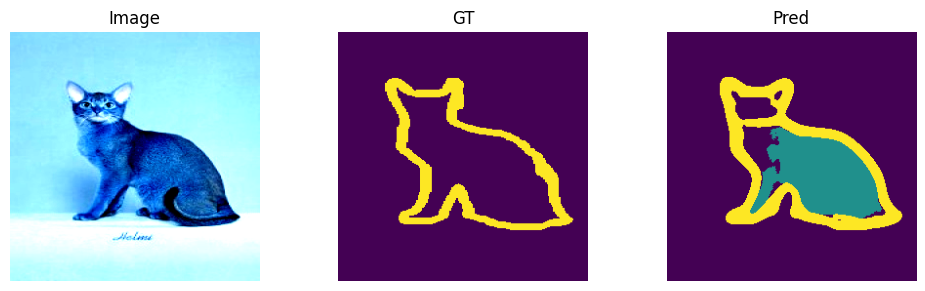

100%|██████████| 1469/1469 [05:34<00:00,  4.39it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8340, Dice=0.9079, Acc=0.8701
Class 75: IoU=0.4660, Dice=0.5362, Acc=0.9047
Class 255: IoU=0.4487, Dice=0.6155, Acc=0.9291
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8363, Dice=0.9102, Acc=0.8735
Class 75: IoU=0.6155, Dice=0.7543, Acc=0.9083
Class 255: IoU=0.4246, Dice=0.5946, Acc=0.9275
Epoch 4, Loss: 0.7629
Train IoU: 0.6255, Dice: 0.7530, Acc: 0.9031
 Val IoU: 0.5829, Dice: 0.6865, Acc: 0.9013


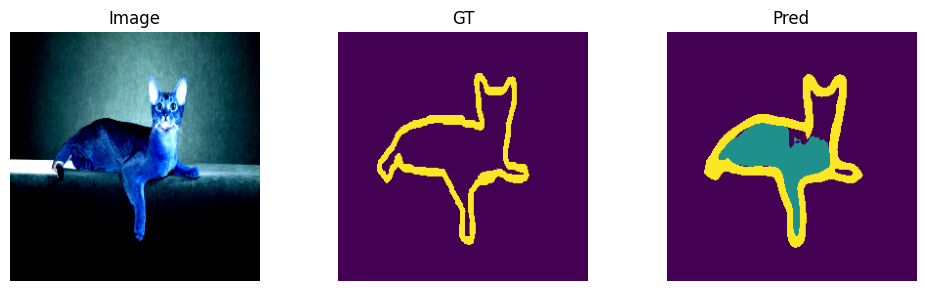

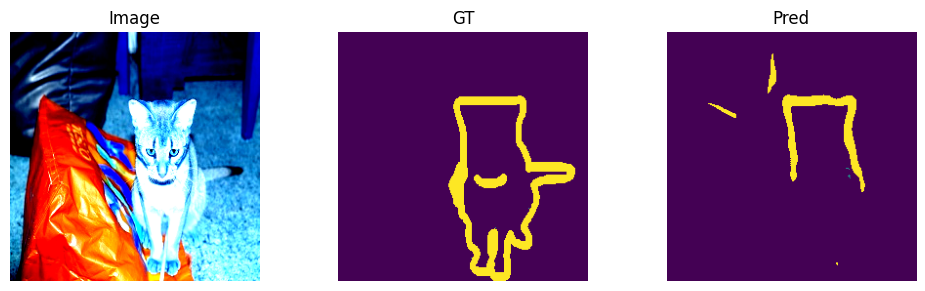

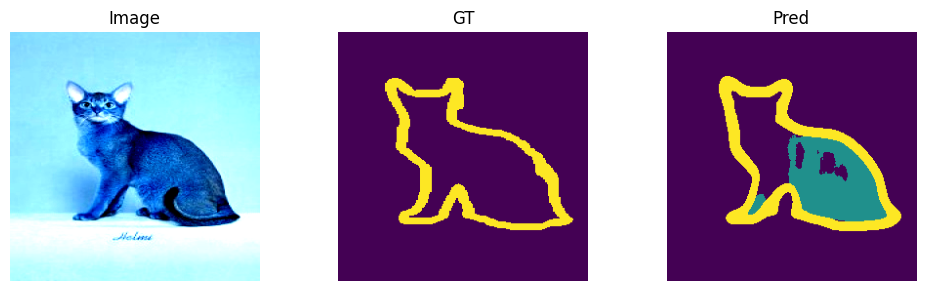

100%|██████████| 1469/1469 [05:35<00:00,  4.38it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8517, Dice=0.9185, Acc=0.8886
Class 75: IoU=0.4564, Dice=0.5308, Acc=0.9244
Class 255: IoU=0.4717, Dice=0.6375, Acc=0.9251
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8637, Dice=0.9264, Acc=0.8964
Class 75: IoU=0.6819, Dice=0.8071, Acc=0.9312
Class 255: IoU=0.4600, Dice=0.6290, Acc=0.9258
Epoch 5, Loss: 0.7117
Train IoU: 0.6685, Dice: 0.7875, Acc: 0.9178
 Val IoU: 0.5933, Dice: 0.6956, Acc: 0.9127


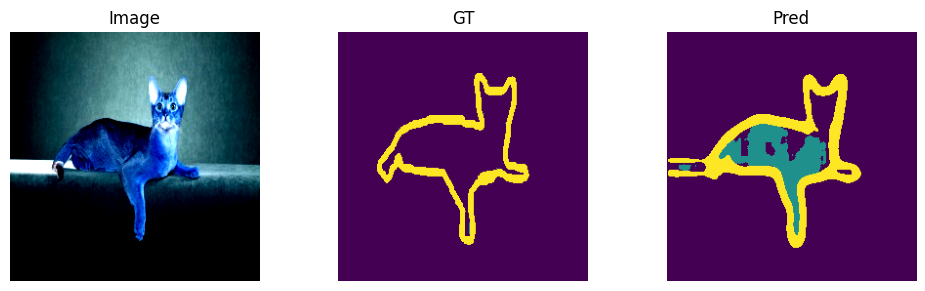

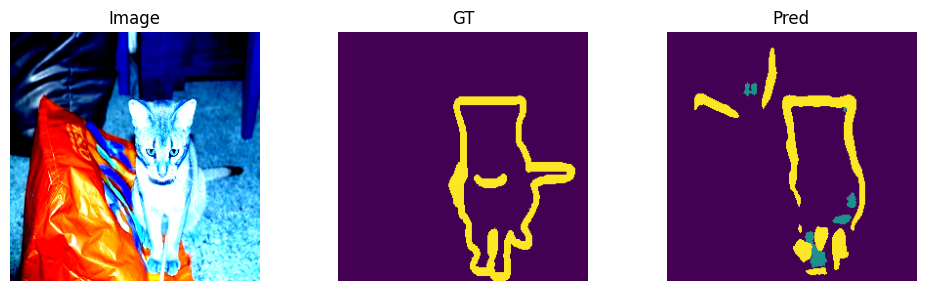

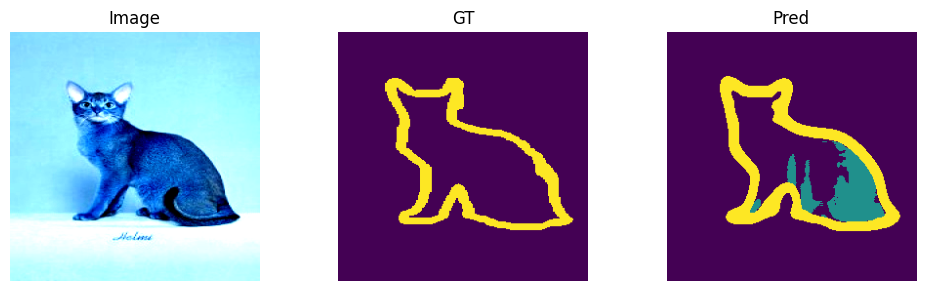

100%|██████████| 1469/1469 [05:36<00:00,  4.37it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8563, Dice=0.9216, Acc=0.8918
Class 75: IoU=0.4925, Dice=0.5552, Acc=0.9232
Class 255: IoU=0.4826, Dice=0.6476, Acc=0.9305
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8761, Dice=0.9337, Acc=0.9085
Class 75: IoU=0.7231, Dice=0.8355, Acc=0.9361
Class 255: IoU=0.4738, Dice=0.6418, Acc=0.9310
Epoch 6, Loss: 0.6650
Train IoU: 0.6910, Dice: 0.8037, Acc: 0.9252
 Val IoU: 0.6105, Dice: 0.7081, Acc: 0.9152


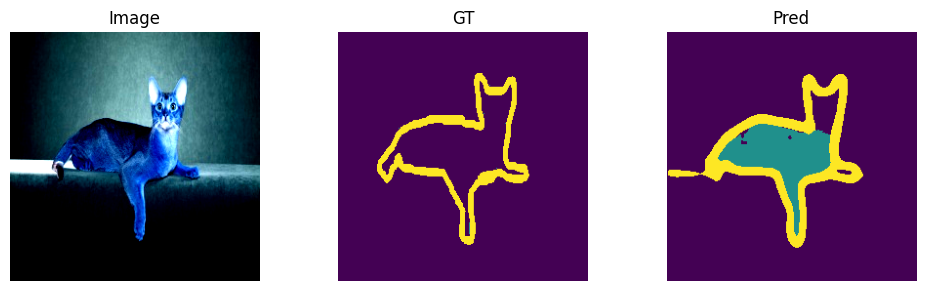

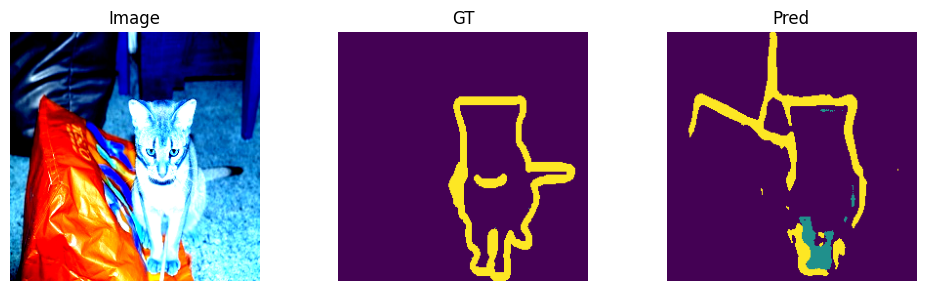

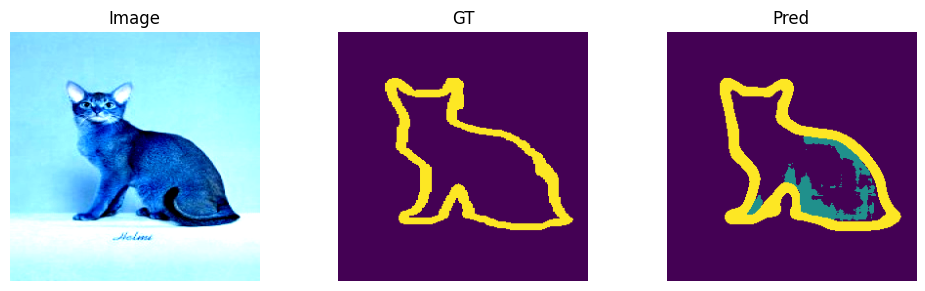

100%|██████████| 1469/1469 [05:34<00:00,  4.39it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8678, Dice=0.9283, Acc=0.9022
Class 75: IoU=0.4929, Dice=0.5559, Acc=0.9383
Class 255: IoU=0.4936, Dice=0.6577, Acc=0.9306
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8895, Dice=0.9413, Acc=0.9182
Class 75: IoU=0.7688, Dice=0.8669, Acc=0.9508
Class 255: IoU=0.4920, Dice=0.6584, Acc=0.9317
Epoch 7, Loss: 0.6256
Train IoU: 0.7168, Dice: 0.8222, Acc: 0.9336
 Val IoU: 0.6181, Dice: 0.7140, Acc: 0.9237


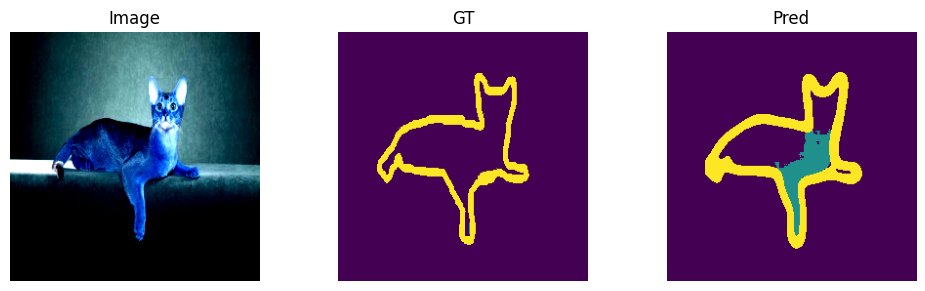

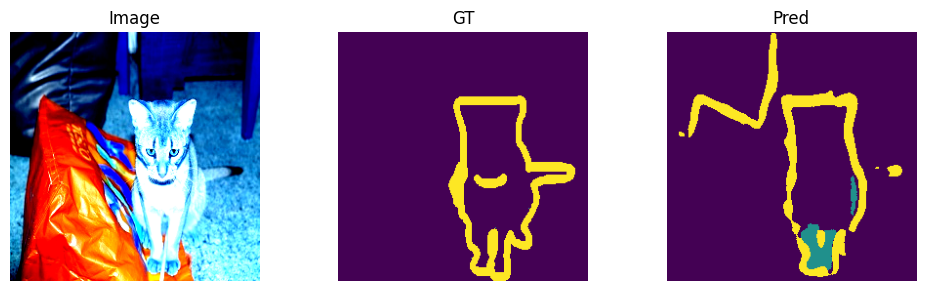

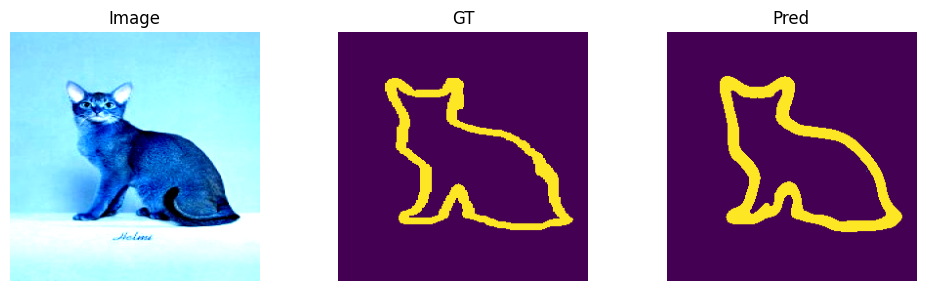

100%|██████████| 1469/1469 [05:32<00:00,  4.42it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8681, Dice=0.9283, Acc=0.9027
Class 75: IoU=0.4915, Dice=0.5547, Acc=0.9362
Class 255: IoU=0.5005, Dice=0.6636, Acc=0.9315
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8954, Dice=0.9446, Acc=0.9231
Class 75: IoU=0.7827, Dice=0.8761, Acc=0.9534
Class 255: IoU=0.4981, Dice=0.6639, Acc=0.9331
Epoch 8, Loss: 0.5914
Train IoU: 0.7254, Dice: 0.8282, Acc: 0.9365
 Val IoU: 0.6200, Dice: 0.7155, Acc: 0.9235


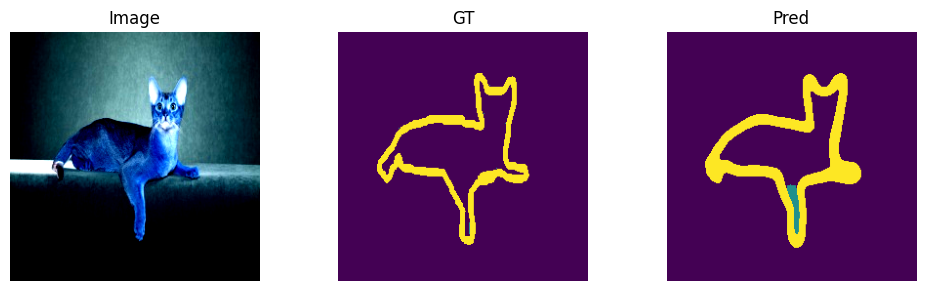

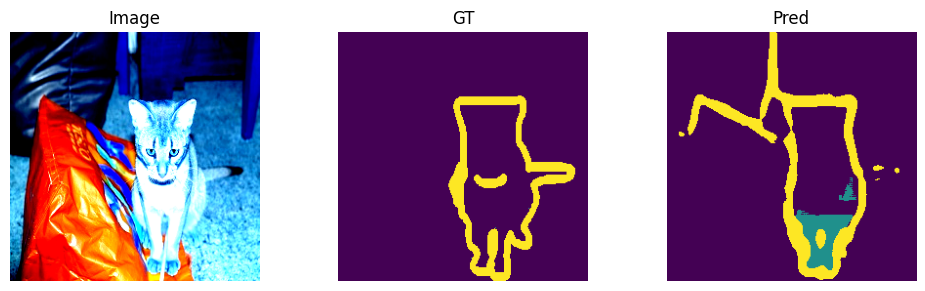

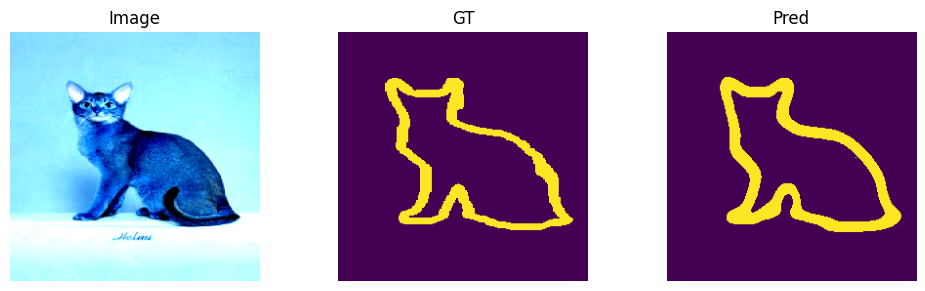

100%|██████████| 1469/1469 [05:32<00:00,  4.42it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8765, Dice=0.9334, Acc=0.9081
Class 75: IoU=0.5075, Dice=0.5650, Acc=0.9411
Class 255: IoU=0.5055, Dice=0.6686, Acc=0.9325
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.9045, Dice=0.9497, Acc=0.9299
Class 75: IoU=0.8027, Dice=0.8889, Acc=0.9592
Class 255: IoU=0.5119, Dice=0.6763, Acc=0.9357
Epoch 9, Loss: 0.5596
Train IoU: 0.7397, Dice: 0.8383, Acc: 0.9416
 Val IoU: 0.6298, Dice: 0.7224, Acc: 0.9272


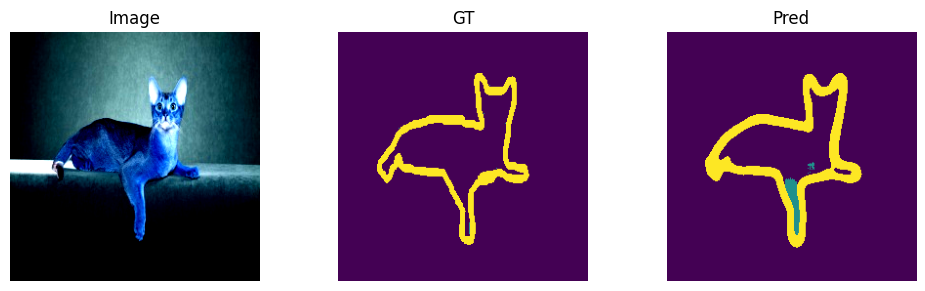

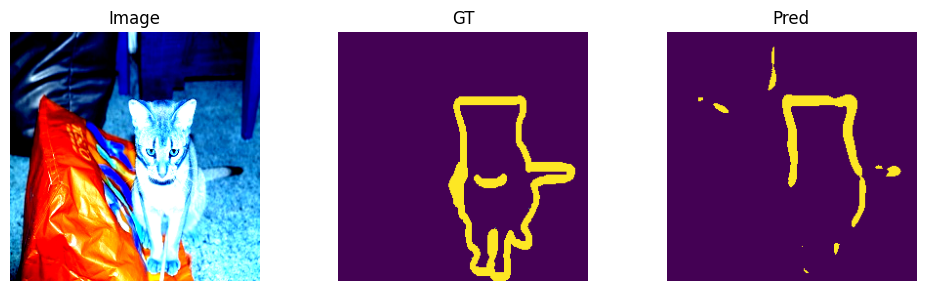

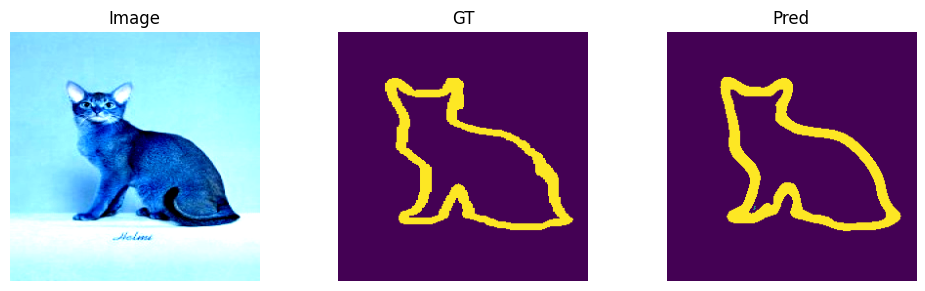

100%|██████████| 1469/1469 [05:35<00:00,  4.38it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8703, Dice=0.9298, Acc=0.9027
Class 75: IoU=0.5099, Dice=0.5663, Acc=0.9341
Class 255: IoU=0.5044, Dice=0.6675, Acc=0.9336
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.9018, Dice=0.9482, Acc=0.9281
Class 75: IoU=0.7874, Dice=0.8785, Acc=0.9545
Class 255: IoU=0.5155, Dice=0.6793, Acc=0.9374
Epoch 10, Loss: 0.5368
Train IoU: 0.7349, Dice: 0.8353, Acc: 0.9400
 Val IoU: 0.6282, Dice: 0.7212, Acc: 0.9235


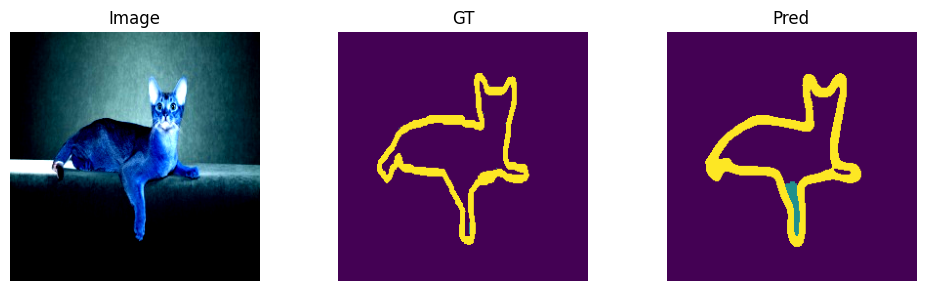

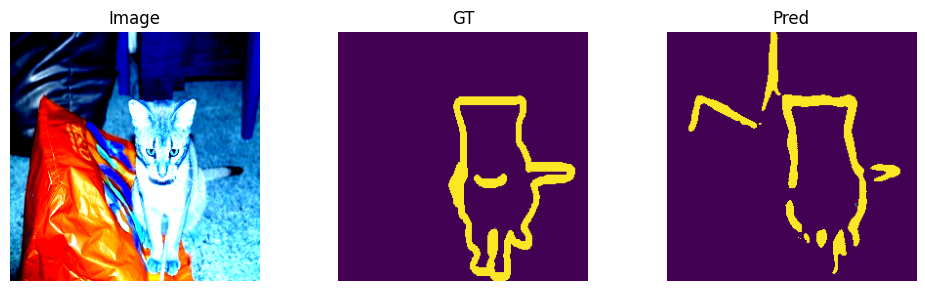

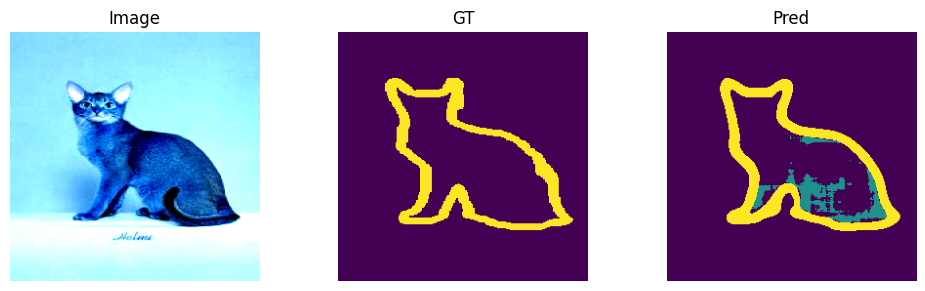

100%|██████████| 1469/1469 [05:38<00:00,  4.34it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8808, Dice=0.9359, Acc=0.9118
Class 75: IoU=0.5028, Dice=0.5623, Acc=0.9430
Class 255: IoU=0.5017, Dice=0.6650, Acc=0.9280
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.9160, Dice=0.9560, Acc=0.9387
Class 75: IoU=0.8234, Dice=0.9020, Acc=0.9651
Class 255: IoU=0.5251, Dice=0.6878, Acc=0.9346
Epoch 11, Loss: 0.5112
Train IoU: 0.7548, Dice: 0.8486, Acc: 0.9461
 Val IoU: 0.6284, Dice: 0.7211, Acc: 0.9276


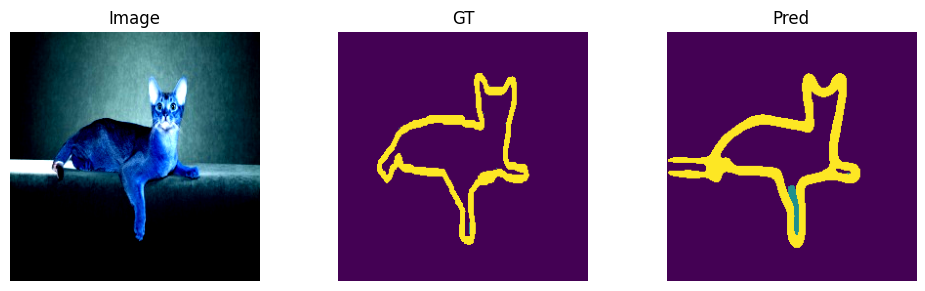

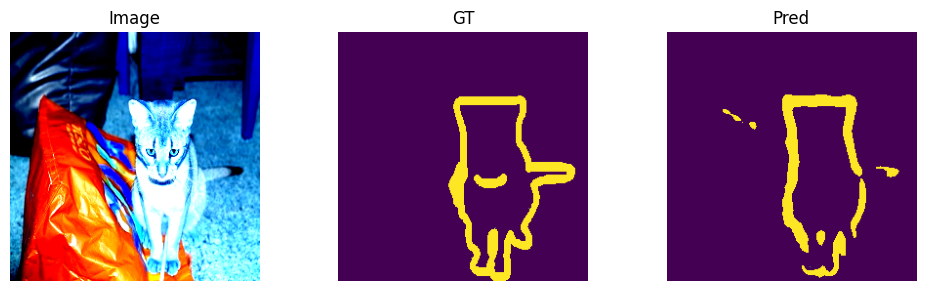

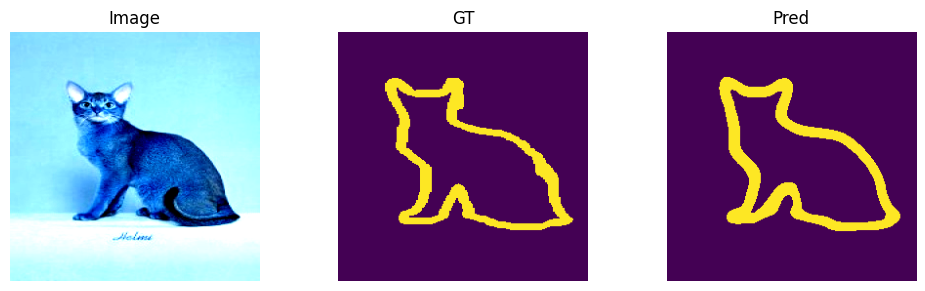

100%|██████████| 1469/1469 [05:39<00:00,  4.32it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8728, Dice=0.9307, Acc=0.9071
Class 75: IoU=0.4765, Dice=0.5446, Acc=0.9417
Class 255: IoU=0.5091, Dice=0.6713, Acc=0.9349
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.9133, Dice=0.9546, Acc=0.9364
Class 75: IoU=0.8355, Dice=0.9096, Acc=0.9661
Class 255: IoU=0.5370, Dice=0.6978, Acc=0.9412
Epoch 12, Loss: 0.4920
Train IoU: 0.7619, Dice: 0.8540, Acc: 0.9479
 Val IoU: 0.6194, Dice: 0.7155, Acc: 0.9279


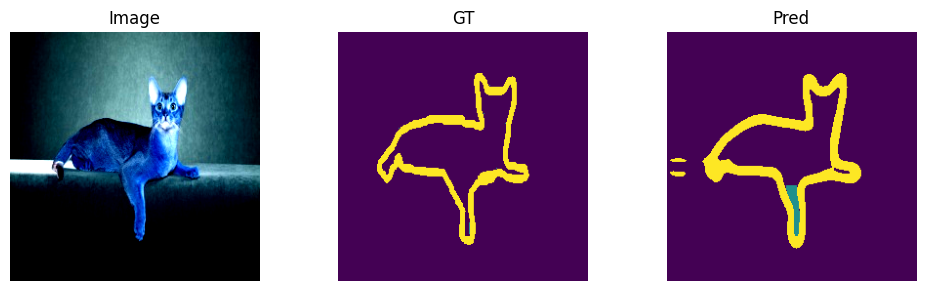

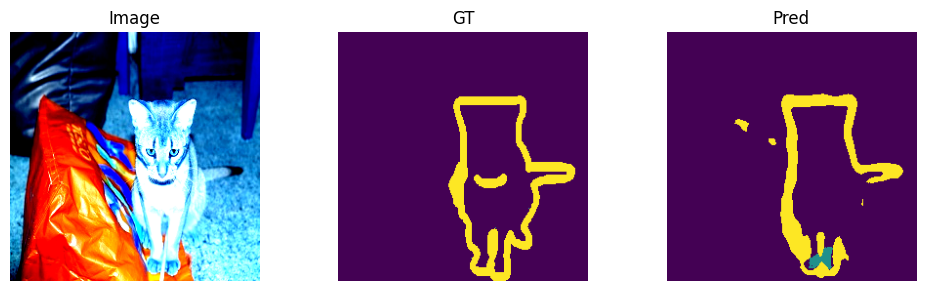

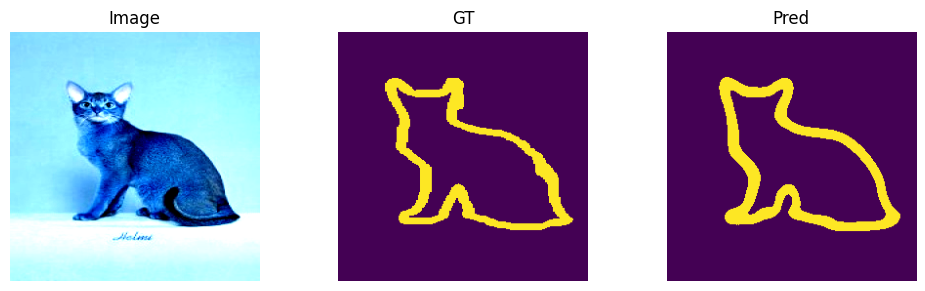

100%|██████████| 1469/1469 [05:39<00:00,  4.33it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8796, Dice=0.9351, Acc=0.9108
Class 75: IoU=0.4985, Dice=0.5593, Acc=0.9447
Class 255: IoU=0.5003, Dice=0.6635, Acc=0.9308
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.9259, Dice=0.9615, Acc=0.9460
Class 75: IoU=0.8628, Dice=0.9259, Acc=0.9730
Class 255: IoU=0.5449, Dice=0.7047, Acc=0.9401
Epoch 13, Loss: 0.4737
Train IoU: 0.7779, Dice: 0.8640, Acc: 0.9530
 Val IoU: 0.6261, Dice: 0.7193, Acc: 0.9288


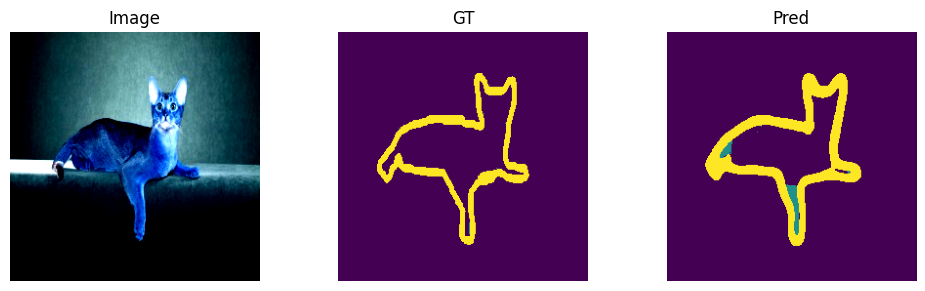

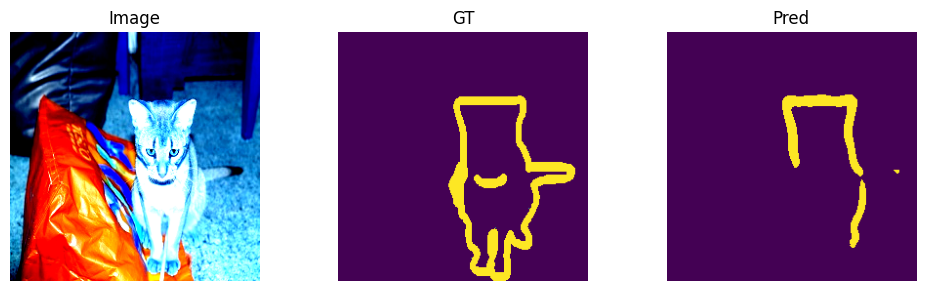

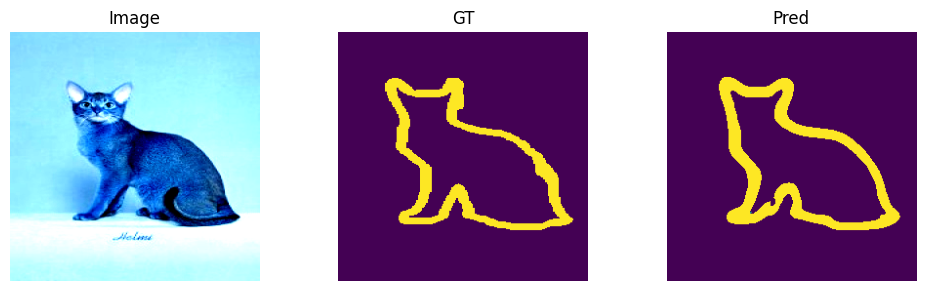

100%|██████████| 1469/1469 [05:40<00:00,  4.32it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8783, Dice=0.9343, Acc=0.9097
Class 75: IoU=0.5096, Dice=0.5662, Acc=0.9423
Class 255: IoU=0.5103, Dice=0.6725, Acc=0.9322
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.9257, Dice=0.9614, Acc=0.9461
Class 75: IoU=0.8627, Dice=0.9257, Acc=0.9728
Class 255: IoU=0.5601, Dice=0.7174, Acc=0.9424
Epoch 14, Loss: 0.4536
Train IoU: 0.7828, Dice: 0.8681, Acc: 0.9538
 Val IoU: 0.6328, Dice: 0.7243, Acc: 0.9281


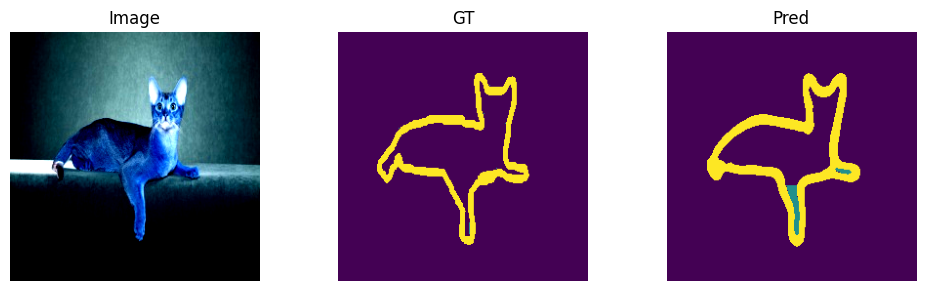

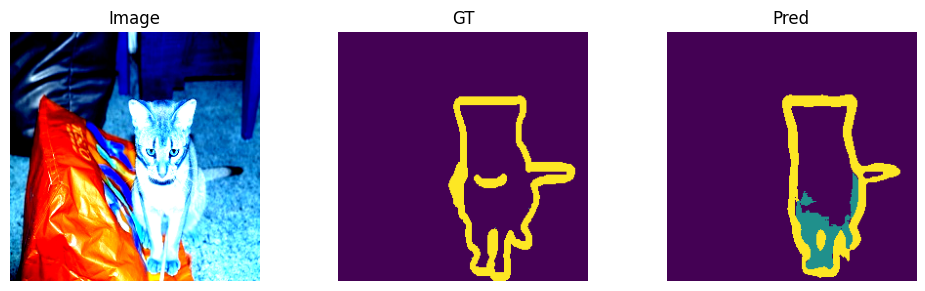

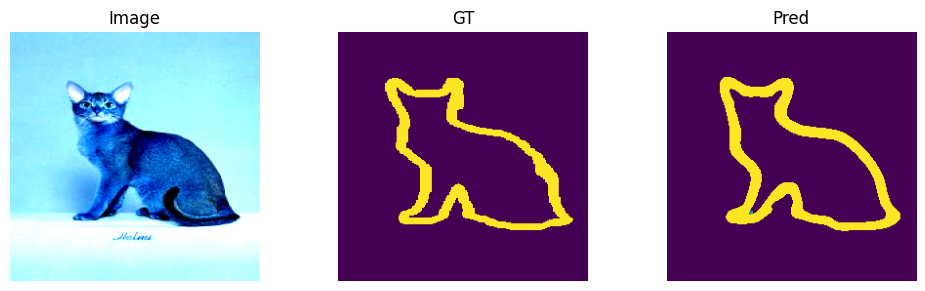

100%|██████████| 1469/1469 [05:41<00:00,  4.30it/s]


--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.8807, Dice=0.9356, Acc=0.9128
Class 75: IoU=0.5009, Dice=0.5610, Acc=0.9434
Class 255: IoU=0.5178, Dice=0.6790, Acc=0.9359
--- Per-Class Metrics (Filtered Classes Only) ---
Class 0: IoU=0.9329, Dice=0.9653, Acc=0.9517
Class 75: IoU=0.8751, Dice=0.9330, Acc=0.9745
Class 255: IoU=0.5736, Dice=0.7284, Acc=0.9471
Epoch 15, Loss: 0.4433
Train IoU: 0.7939, Dice: 0.8756, Acc: 0.9578
 Val IoU: 0.6331, Dice: 0.7252, Acc: 0.9307


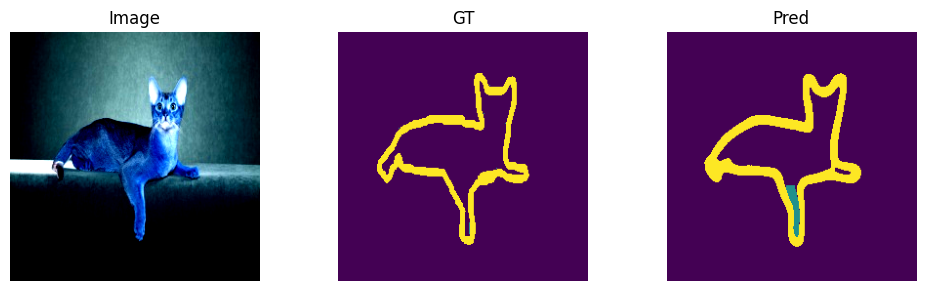

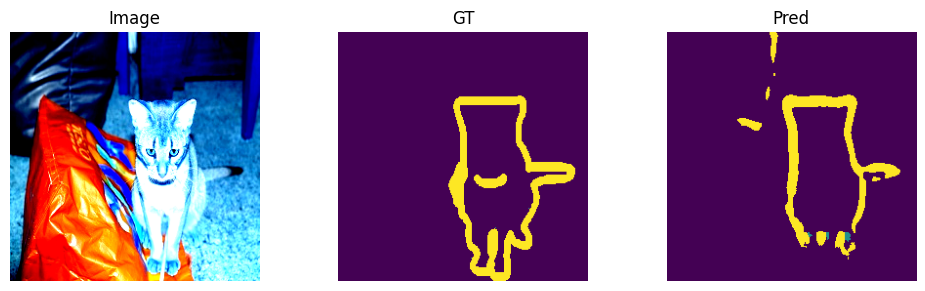

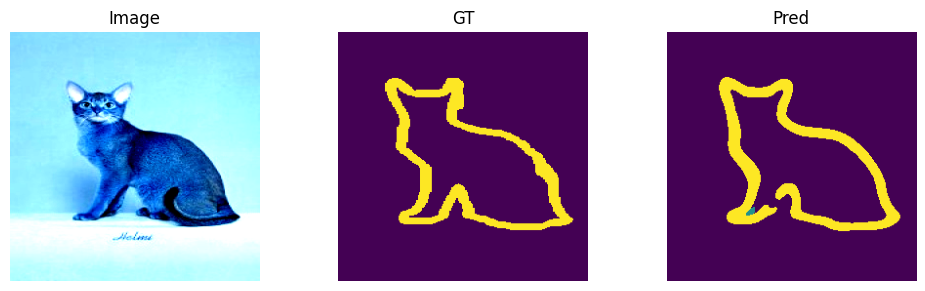

In [ ]:
# Enhanced U-Net Training Pipeline with Dice + CrossEntropy + Visualisation + Metrics + Logging + Class Filtering

import os
import cv2
import csv
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader, ConcatDataset
import albumentations as A
from tqdm import tqdm

# ============================
# DEVICE SETUP
# ============================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# ============================
# DATASET SETUP
# ============================
EXTRACT_PATH = "/content/drive/MyDrive/CleanExtractedDataset/Dataset_filtered"
TRAIN_IMAGES_PATH = os.path.join(EXTRACT_PATH, "Resized_Train/color")
TRAIN_MASKS_PATH = os.path.join(EXTRACT_PATH, "Resized_Train/label")
AUG_IMAGES_PATH   = os.path.join(EXTRACT_PATH, "Augmented_Train/color")
AUG_MASKS_PATH    = os.path.join(EXTRACT_PATH, "Augmented_Train/label")
VAL_IMAGES_PATH   = os.path.join(EXTRACT_PATH, "Resized_Validation/color")
VAL_MASKS_PATH    = os.path.join(EXTRACT_PATH, "Resized_Validation/label")

# ============================
# CLASS FILTERING SETUP (Only classes 0, 75, 255)
# ============================
CLASS_LABELS = [0, 75, 255]
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASS_LABELS)}
IDX_TO_CLASS = {i: c for i, c in enumerate(CLASS_LABELS)}
NUM_CLASSES = len(CLASS_LABELS)

def remap_mask(mask):
    return np.vectorize(lambda v: CLASS_TO_IDX.get(v, 0))(mask)

# ============================
# MODEL + LOSS
# ============================
class DiceLoss(nn.Module):
    def __init__(self, smooth=1e-5):
        super().__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        pred = torch.softmax(pred, dim=1)
        target_one_hot = F.one_hot(target, num_classes=pred.shape[1]).permute(0, 3, 1, 2)
        intersection = (pred * target_one_hot).sum((2, 3))
        union = pred.sum((2, 3)) + target_one_hot.sum((2, 3))
        dice = (2 * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice.mean()

def combined_loss(pred, target):
    ce = nn.CrossEntropyLoss()(pred, target)
    dice = DiceLoss()(pred, target)
    return ce + dice

# ============================
# U-NET
# ============================
class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=NUM_CLASSES):
        super().__init__()
        def block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU(),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.BatchNorm2d(out_c),
                nn.ReLU()
            )
        self.enc1 = block(in_channels, 64)
        self.enc2 = block(64, 128)
        self.enc3 = block(128, 256)
        self.enc4 = block(256, 512)
        self.pool = nn.MaxPool2d(2)
        self.bottleneck = block(512, 1024)
        self.up4 = nn.ConvTranspose2d(1024, 512, 2, stride=2)
        self.dec4 = block(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = block(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = block(128, 64)
        self.out = nn.Conv2d(64, out_channels, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        e4 = self.enc4(self.pool(e3))
        b = self.bottleneck(self.pool(e4))
        d4 = self.dec4(torch.cat([self.up4(b), e4], dim=1))
        d3 = self.dec3(torch.cat([self.up3(d4), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.out(d1)

# ============================
# DATASET
# ============================
class SegDataset(Dataset):
    def __init__(self, img_dir, mask_dir):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.images = sorted(os.listdir(img_dir))
        self.transform = A.Compose([
            A.Resize(256, 256),
            A.Normalize(),
        ])

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        mask_name = img_name.replace(".jpg", ".png")
        image = cv2.imread(os.path.join(self.img_dir, img_name))
        mask = cv2.imread(os.path.join(self.mask_dir, mask_name), cv2.IMREAD_GRAYSCALE)
        augmented = self.transform(image=image, mask=mask)
        img = torch.tensor(augmented['image'].transpose(2,0,1), dtype=torch.float32)
        mask = torch.tensor(remap_mask(augmented['mask']), dtype=torch.long)
        return img, mask

# ============================
# TRAINING + VISUALISATION + METRICS + LOGGING
# ============================
def evaluate_metrics(model, loader):
    model.eval()
    num_classes = model.out.out_channels
    iou_per_class = torch.zeros(num_classes)
    dice_per_class = torch.zeros(num_classes)
    acc_per_class = torch.zeros(num_classes)
    class_counts = torch.zeros(num_classes)

    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            out = model(x)
            preds = torch.argmax(out, dim=1)
            for cls in range(num_classes):
                p_cls = (preds == cls)
                t_cls = (y == cls)
                intersection = (p_cls & t_cls).sum()
                union = (p_cls | t_cls).sum()
                dice = (2 * intersection) / ((p_cls.sum() + t_cls.sum()) + 1e-8)
                acc = (p_cls == t_cls).float().mean()
                if t_cls.sum() > 0:
                    iou_per_class[cls] += (intersection.float() / (union.float() + 1e-8)).cpu()
                    dice_per_class[cls] += dice.cpu()
                    acc_per_class[cls] += acc.cpu()
                    class_counts[cls] += 1

    iou_mean = (iou_per_class / class_counts.clamp(min=1)).numpy()
    dice_mean = (dice_per_class / class_counts.clamp(min=1)).numpy()
    acc_mean = (acc_per_class / class_counts.clamp(min=1)).numpy()

    print("--- Per-Class Metrics (Filtered Classes Only) ---")
    for cls in range(num_classes):
        real_class = IDX_TO_CLASS[cls]
        print(f"Class {real_class}: IoU={iou_mean[cls]:.4f}, Dice={dice_mean[cls]:.4f}, Acc={acc_mean[cls]:.4f}")

    return iou_mean.mean(), dice_mean.mean(), acc_mean.mean()

def evaluate_and_visualise(model, loader):
    model.eval()
    with torch.no_grad():
        imgs, masks = next(iter(loader))
        imgs, masks = imgs.to(device), masks.to(device)
        preds = model(imgs)
        preds = torch.argmax(preds, dim=1)
        for i in range(min(3, len(imgs))):
            plt.figure(figsize=(10, 3))
            plt.subplot(1,3,1); plt.imshow(np.clip(imgs[i].permute(1,2,0).cpu().numpy()*0.5+0.5, 0, 1)); plt.title("Image"); plt.axis('off')
            plt.subplot(1,3,2); plt.imshow(masks[i].cpu()); plt.title("GT"); plt.axis('off')
            plt.subplot(1,3,3); plt.imshow(preds[i].cpu()); plt.title("Pred"); plt.axis('off')
            plt.tight_layout(); plt.show()

def train(model, train_loader, val_loader, epochs=15, log_path="/content/drive/MyDrive/CleanExtractedDataset/content/training_logUpd.csv"):
    os.makedirs(os.path.dirname(log_path), exist_ok=True)
    if not os.path.exists(log_path):
        with open(log_path, mode='w', newline='') as f:
            writer = csv.writer(f)
            writer.writerow(["Epoch", "Loss", "Train IoU", "Train Dice", "Train Acc", "Val IoU", "Val Dice", "Val Acc"])

    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=2)

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        for x, y in tqdm(train_loader):
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            pred = model(x)
            loss = combined_loss(pred, y)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()

        val_iou, val_dice, val_acc = evaluate_metrics(model, val_loader)
        train_iou, train_dice, train_acc = evaluate_metrics(model, train_loader)
        print(f"Epoch {epoch+1}, Loss: {total_loss/len(train_loader):.4f}")
        print(f"Train IoU: {train_iou:.4f}, Dice: {train_dice:.4f}, Acc: {train_acc:.4f}")
        print(f" Val IoU: {val_iou:.4f}, Dice: {val_dice:.4f}, Acc: {val_acc:.4f}")
        scheduler.step(total_loss)
        evaluate_and_visualise(model, val_loader)

        with open(log_path, mode='a', newline='') as f:
            writer = csv.writer(f)
            writer.writerow([
                epoch + 1,
                round(total_loss / len(train_loader), 4),
                round(train_iou, 4), round(train_dice, 4), round(train_acc, 4),
                round(val_iou, 4), round(val_dice, 4), round(val_acc, 4)
            ])

# ============================
# RUN
# ============================
model = UNet(in_channels=3, out_channels=NUM_CLASSES).to(device)

train_data = ConcatDataset([
    SegDataset(TRAIN_IMAGES_PATH, TRAIN_MASKS_PATH),
    SegDataset(AUG_IMAGES_PATH, AUG_MASKS_PATH)
])
val_data = SegDataset(VAL_IMAGES_PATH, VAL_MASKS_PATH)

train_loader = DataLoader(train_data, batch_size=8, shuffle=True)
val_loader = DataLoader(val_data, batch_size=4, shuffle=False)

train(model, train_loader, val_loader, epochs=15)

In [ ]:
train(model, train_loader, val_loader, epochs=15)

# Save model to Drive
torch.save(model.state_dict(), "/content/drive/MyDrive/CleanExtractedDataset/content/unet_model_filtered.pth")
print("Model saved to Google Drive.")

  3%|▎         | 45/1469 [00:10<05:34,  4.26it/s]


KeyboardInterrupt: 